In [1]:
import pandas as pd
import plotly.express as px

In [2]:
airbnb_ny_df=pd.read_csv(r"C:\Users\Varshitha\Downloads\AB_NYC_2019.csv")

In [3]:
airbnb_ny_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
# Check for missing values
missing_values = airbnb_ny_df.isnull().sum()  # Count missing values in each column
print("Missing Values in Each Column:")
print(missing_values)

Missing Values in Each Column:
id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


In [5]:
airbnb_ny_cleaned = airbnb_ny_df.dropna(subset=['name', 'host_name','last_review','reviews_per_month'])
airbnb_ny_cleaned

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,36425863,Lovely Privet Bedroom with Privet Restroom,83554966,Rusaa,Manhattan,Upper East Side,40.78099,-73.95366,Private room,129,1,1,2019-07-07,1.00,1,147
48790,36427429,No.2 with queen size bed,257683179,H Ai,Queens,Flushing,40.75104,-73.81459,Private room,45,1,1,2019-07-07,1.00,6,339
48799,36438336,Seas The Moment,211644523,Ben,Staten Island,Great Kills,40.54179,-74.14275,Private room,235,1,1,2019-07-07,1.00,1,87
48805,36442252,1B-1B apartment near by Metro,273841667,Blaine,Bronx,Mott Haven,40.80787,-73.92400,Entire home/apt,100,1,2,2019-07-07,2.00,1,40


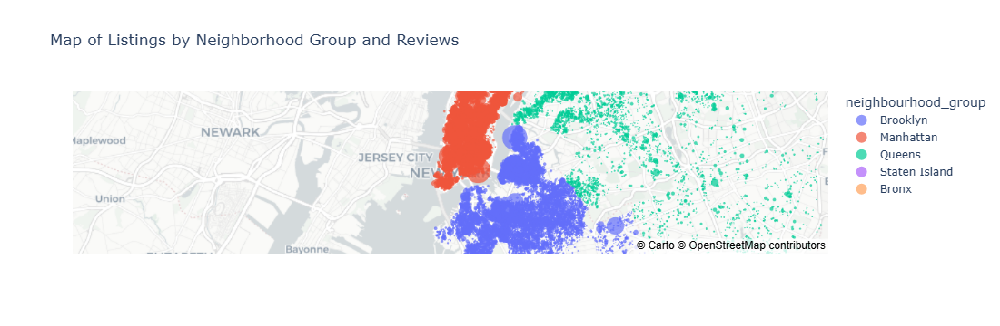

In [6]:
fig = px.scatter_mapbox(airbnb_ny_cleaned, lat='latitude', lon='longitude', color='neighbourhood_group', size='price', 
                        title='Map of Listings by Neighborhood Group and Reviews',
                        mapbox_style="carto-positron",
                        center={'lat': 40.7128, 'lon': -74.0060}, # Centering on New York City
                        zoom=10)  # Adjust zoom level for city-wide view
fig.show()

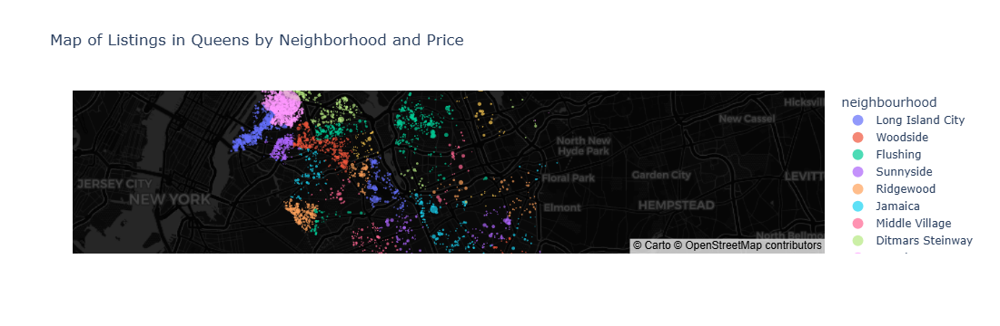

In [7]:
# Filter dataset for Queens
df_queens = airbnb_ny_cleaned[airbnb_ny_cleaned['neighbourhood_group'] == 'Queens']

# Create the mapbox plot
fig = px.scatter_mapbox(df_queens, lat='latitude', lon='longitude', color='neighbourhood', size='price', 
                        title='Map of Listings in Queens by Neighborhood and Price',
                        mapbox_style="carto-darkmatter",
                        center={'lat': 40.7282, 'lon': -73.7949},  # Centering on Queens
                        zoom=10)  # Adjust zoom level for Queens
fig.show()

C:\Users\Varshitha\AppData\Local\Temp\ipykernel_1984\661510530.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



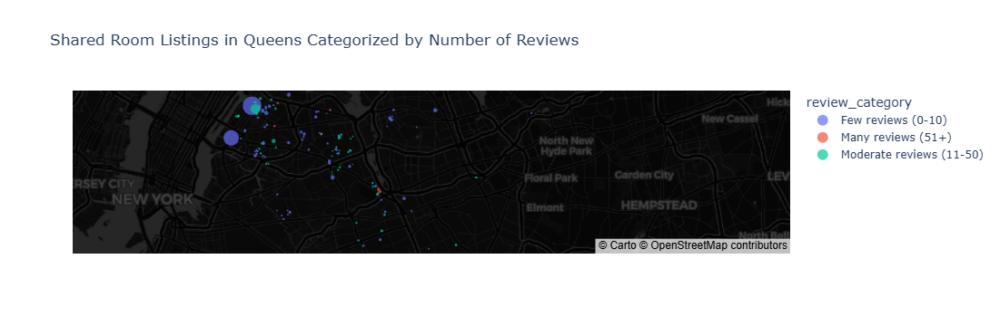

In [8]:
# Filter dataset for Queens and shared rooms
df_shared_rooms = airbnb_ny_cleaned[(airbnb_ny_cleaned['neighbourhood_group'] == 'Queens') & (airbnb_ny_cleaned['room_type'] == 'Shared room')]

# Create bins for the number of reviews
bins = [0, 10, 50, float('inf')]  # Define the bin ranges
labels = ['Few reviews (0-10)', 'Moderate reviews (11-50)', 'Many reviews (51+)']  # Define the labels for bins
df_shared_rooms['review_category'] = pd.cut(df_shared_rooms['number_of_reviews'], bins=bins, labels=labels, include_lowest=True)

# Create the scatter mapbox plot
fig = px.scatter_mapbox(
    df_shared_rooms, 
    lat='latitude', 
    lon='longitude', 
    color='review_category',  # Color based on the review category
    size='price',  # Size by price
    hover_name='name',
    hover_data={
        'price': True, 
        'number_of_reviews': True, 
        'availability_365': True
    },
    title='Shared Room Listings in Queens Categorized by Number of Reviews',
    mapbox_style="carto-darkmatter",  # Use dark map style
    center={'lat': 40.7282, 'lon': -73.7949},  # Centering on Queens
    zoom=10,
    size_max=15
)

fig.show()

C:\Users\Varshitha\AppData\Local\Temp\ipykernel_1984\1480096541.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



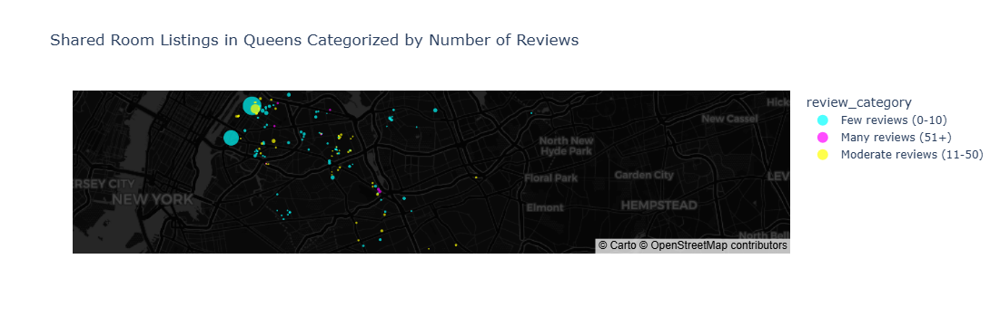

In [9]:
# Filter dataset for Queens and shared rooms
df_shared_rooms = airbnb_ny_cleaned[(airbnb_ny_cleaned['neighbourhood_group'] == 'Queens') & (airbnb_ny_cleaned['room_type'] == 'Shared room')]

# Create bins for the number of reviews
bins = [0, 10, 50, float('inf')]  # Define the bin ranges
labels = ['Few reviews (0-10)', 'Moderate reviews (11-50)', 'Many reviews (51+)']  # Define the labels for bins
df_shared_rooms['review_category'] = pd.cut(df_shared_rooms['number_of_reviews'], bins=bins, labels=labels, include_lowest=True)

# Define a custom color map for categories
custom_colors = {
    'Few reviews (0-10)': '#00FFFF',   # Cyan
    'Moderate reviews (11-50)': '#FFFF00',   # Yellow
    'Many reviews (51+)': '#FF00FF'    # Magenta
}

# Create the scatter mapbox plot with custom colors
fig = px.scatter_mapbox(
    df_shared_rooms, 
    lat='latitude', 
    lon='longitude', 
    color='review_category',  # Color based on the review category
    size='price',  # Size by price
    color_discrete_map=custom_colors,  # Apply custom color palette
    hover_name='name',
    hover_data={
        'price': True, 
        'number_of_reviews': True, 
        'availability_365': True
    },
    title='Shared Room Listings in Queens Categorized by Number of Reviews',
    mapbox_style="carto-darkmatter",  # Use dark map style
    center={'lat': 40.7282, 'lon': -73.7949},  # Centering on Queens
    zoom=10,
    size_max=15
)

fig.show()

GROUP-2

In [11]:
import pandas as pd
import plotly.express as px

In [12]:
SP = pd.read_csv(r"C:\Users\Varshitha\Downloads\S&P.csv", header=1)
SP.head()

,Year,S&P 500,Dividends,Dividend Yield,T.Bond rate,Return on bond,Aaa Bond Rate,Return on Aaa,Baa Bond Rate,Return on Baa,Returns on Real Estate,Unnamed: 11
0,1927.0,17.66,0.62,3.50%,3.17%,NaN,4.46%,NaN,5.32%,NaN,NaN,NaN
1,1928.0,24.35,1.05,4.30%,3.45%,0.84%,4.61%,3.28%,5.60%,3.22%,1.49%,NaN
2,1929.0,21.45,0.88,4.10%,3.36%,4.20%,4.67%,4.14%,5.95%,3.02%,-2.06%,NaN
3,1930.0,15.34,0.72,4.70%,3.22%,4.54%,4.52%,5.86%,6.71%,0.54%,-4.30%,NaN
4,1931.0,8.12,0.50,6.10%,3.93%,-2.56%,5.32%,-1.56%,10.42%,-15.68%,-8.15%,NaN


In [13]:
fig = px.line(SP, x="Year", y="S&P 500" , title="Worth of S&P stock from 1927-2023")

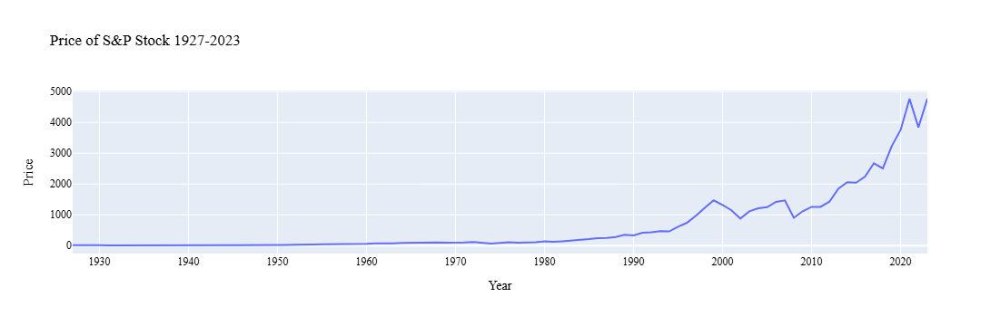

In [14]:
fig.update_layout(
    title="Price of S&P Stock 1927-2023",
    xaxis_title="Year", 
    yaxis_title="Price", 
    font=dict(
        family="Couier New",
        size=12,
        color="black"
    )
)

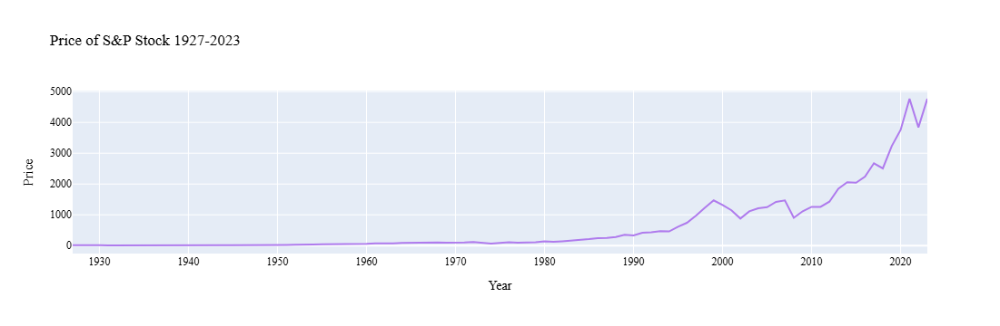

In [15]:
fig.update_traces(line_color="#AF7BED", selector=dict(type='scatter'))

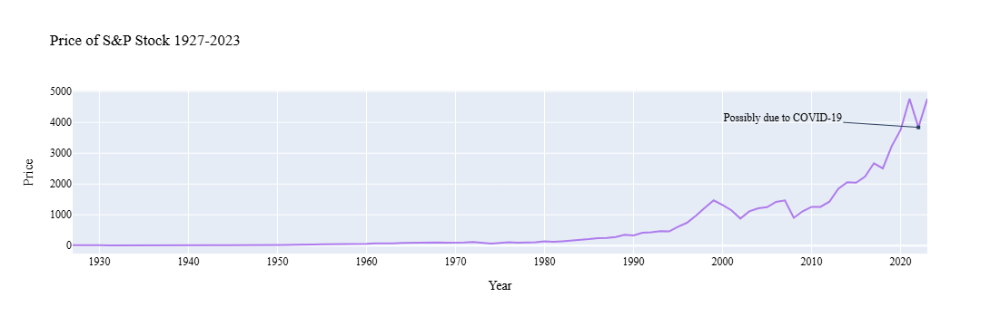

In [16]:
fig.add_annotation(
    x="2022",
    y=3839.5,
    text="Possibly due to COVID-19",
    showarrow=True,
    arrowhead=7,
    ax=-150,
    ay=-10,
    hovertext="COVID-19 was a pandemic lasting from 2020 until 2023 <br> This is me creating a second line" ,
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="black",
        font=dict(
            color="black"
        )
    )
)
    
    

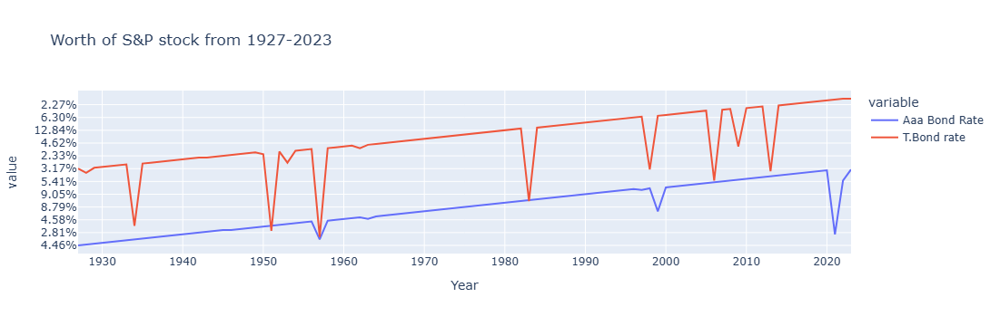

In [17]:
fig = px.line(SP, x="Year", y=["Aaa Bond Rate", "T.Bond rate"] , title="Worth of S&P stock from 1927-2023")
fig.show()

GROUP-3

In [18]:
import plotly.express as px
import pandas as pd

In [19]:
data=pd.read_csv(r"C:\Users\Varshitha\Downloads\country_wise_latest.csv")

In [20]:
data.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [21]:
data.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


In [22]:
data.isnull().sum()

Country/Region            0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
Confirmed last week       0
1 week change             0
1 week % increase         0
WHO Region                0
dtype: int64

In [23]:
data.drop_duplicates()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,West Bank and Gaza,10621,78,3752,6791,152,2,0,0.73,35.33,2.08,8916,1705,19.12,Eastern Mediterranean
183,Western Sahara,10,1,8,1,0,0,0,10.00,80.00,12.50,10,0,0.00,Africa
184,Yemen,1691,483,833,375,10,4,36,28.56,49.26,57.98,1619,72,4.45,Eastern Mediterranean
185,Zambia,4552,140,2815,1597,71,1,465,3.08,61.84,4.97,3326,1226,36.86,Africa


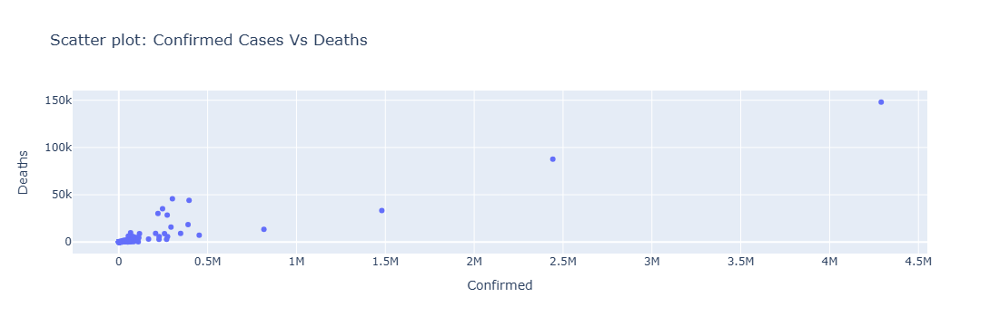

In [24]:
fig=px.scatter(data, x='Confirmed', y='Deaths', title='Scatter plot: Confirmed Cases Vs Deaths')
fig.show()

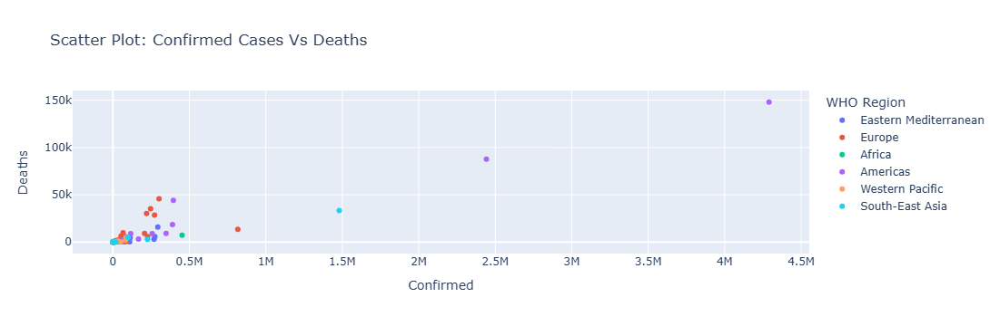

In [35]:
fig = px.scatter(data, x='Confirmed', y='Deaths',color='WHO Region',title='Scatter Plot: Confirmed Cases Vs Deaths')
fig.show()

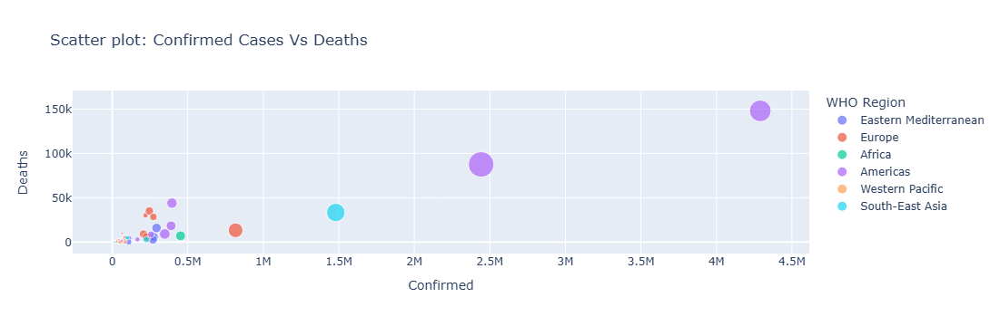

In [36]:
fig=px.scatter(data, x='Confirmed', y='Deaths', color ='WHO Region', size = 'Recovered', hover_data=['Country/Region', 'Active', 'New cases'], title='Scatter plot: Confirmed Cases Vs Deaths')
fig.show()

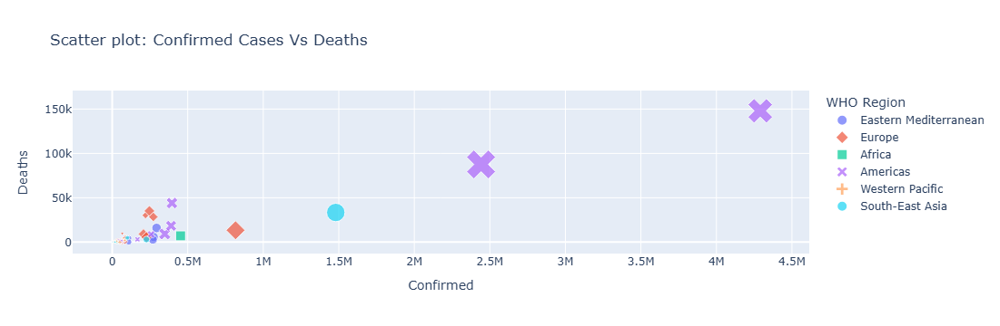

In [26]:
fig=px.scatter(data, x='Confirmed', y='Deaths', color ='WHO Region', size = 'Recovered', hover_data=['Country/Region', 'Active', 'New cases'], title='Scatter plot: Confirmed Cases Vs Deaths', symbol='WHO Region')
fig.show()

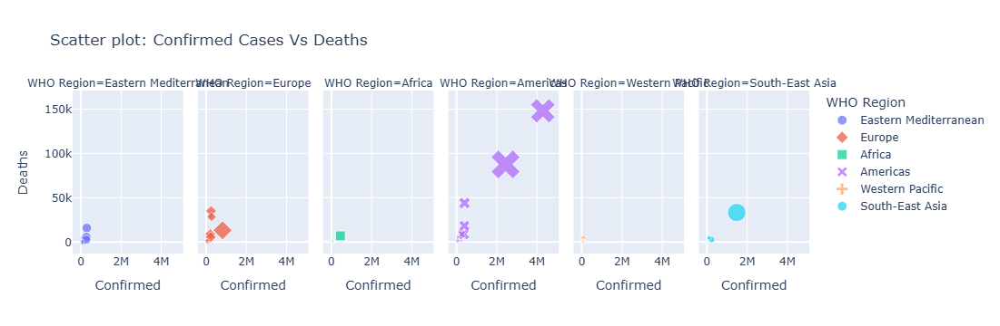

In [27]:
fig=px.scatter(data, x='Confirmed', y='Deaths', color ='WHO Region', size = 'Recovered', hover_data=['Country/Region', 'Active', 'New cases'], title='Scatter plot: Confirmed Cases Vs Deaths', symbol='WHO Region', facet_col='WHO Region')
fig.show()

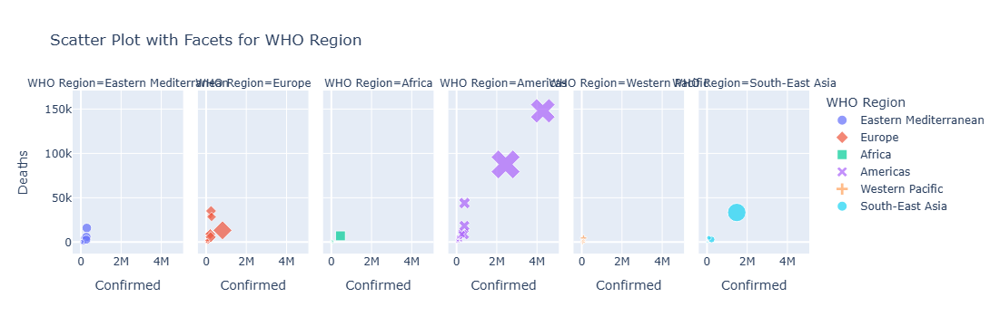

In [39]:
fig = px.scatter(data, x='Confirmed', y='Deaths', color='WHO Region', size='Recovered', hover_data=['Country/Region', 'Active', 'New cases', 'New deaths', 'New recovered'],symbol='WHO Region', facet_col='WHO Region', title='Scatter Plot with Facets for WHO Region')
fig.show()
